# <center> 19CSE431 - Digital Image Processing </center>
## <center> Lab Evaluation 2 </center>

### Members:





| S.No      | Name | Roll No     |
| :---:        |    :----:   |          :---: |
| 1.      | M Jietthesh Balaji       | CB.EN.U4CSE20322   |
| 2.   | Raj Mota        | CB.EN.U4CSE20349      |
| 3.      | Sai Sidharth Sriram       | CB.EN.U4CSE20352   |
| 4.   | Sakthi Vikkraman R       | CB.EN.U4CSE20353      |

### Problem Statement:  
Recently, Image Processing Techniques are widely used in several medical areas for image improvement and nowadays is used for early detection and treatment. Medical field is one such field where time factor is at the utmost priority and it is very important to detect the abnormal tissues in target images in the case of Cancer. In recent times, Lung Cancer has become a sign of fear amongst the people all over the world. With the advancement in technology, it is now possible to automate this whole process with the help of Computer Vision. With the help of Image Processing techniques, it is now possible to automate the pre-processing of Medical Images which aids in early detection of Cancer growth. In this particular paper, CT (Computed Tomography) Scan Images of Lungs are processed using various techniques like Filtering, Noise Removal, Morphological Techniques and Segmentation Techniques. Image Quality and Accuracy are the core areas of focus in this paper and our end goal is to generalize the methods use so that the same procedure can be scaled up to work with any given dataset. 

In [1]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
from numpy.fft import fft2, ifft2
from skimage import io, img_as_float
from skimage.filters import unsharp_mask
from skimage.filters import median
from skimage.morphology import disk
from skimage.filters import gaussian
from skimage.filters import laplace
from skimage.util import random_noise
from skimage.filters import sobel
import math
from math import sqrt, log10, exp
from PIL import Image, ImageFilter
from PIL import ImageChops
from scipy.signal import gaussian
from scipy.ndimage.filters import median_filter
import warnings
warnings.filterwarnings('ignore')

In [2]:
image_path = r'C:/Users/Saisid/Downloads/College/Semester 5/19CSE431 - Digital Image Processing/Additional Files/Lung Cancer Datasets/Dataset - Kaggle/Image Dataset/'

In [3]:
img_base = cv2.imread(image_path + 'Cancer/cancer_16.jpg',0)

### Noise Models

* Periodic Noise - Use Notch Filter to remove
* Salt and Pepper Noise - Use Median Filter to remove
* Gaussian Noise - Use Averaging Filter to denoise
* Speckle Noise - Homomorphic Filtering is used to denoise - Weiner(Gaussian) Bilateral(Preserves Edges) Filter (WB Filter),
Found in Ultrasonic and CT Scan Images
* Uniform Noise - Use Averaging Filter

The analysis is performed based on 2 Image Quality Metrics 
## Evaluation Metrics for Images:  
1. Peak Signal to Noise Ratio (PSNR) 
2. Root Mean Square Error (RMSE)

In [4]:
def mse(img1, img2):
    #MSE = sum((im1(x,y) - im2(x,y)**2))/m*n
    squared_diff = (img1 -img2) ** 2
    summed = np.sum(squared_diff)
    num_pix = img1.shape[0] * img1.shape[1] #img1 and 2 should have same shape
    err = summed / num_pix
    return err

def psnr(img1, img2):
    #PSNR = 10log10(R^2 / MSE)
    mse_ = mse(img1, img2)
    #This means that there is no noise present in the image
    if mse_ == 0:
        return "Same Image"
    return 10 * math.log10(255**2 / mse_)

def rmsdiff(img1, img2):
    #Calculate the Root-Mean-Square difference between two images
    #RMSE = sqrt(MSE)
    mse_ = mse(img1, img2)
    rmse = sqrt(mse_)
    return rmse

### Periodic Noise

In [5]:
def add_periodic(img):
    orig = img
    sh = orig.shape[0], orig.shape[1]
    noise = np.zeros(sh, dtype='float64')
    X, Y = np.meshgrid(range(0, sh[1]), range(0, sh[0]))
    
    A = 50
    u0 = 45
    v0 = 50
    
    noise += A*np.sin(X*u0 + Y*v0)

    A = -18
    u0 = -45
    v0 = 50

    noise += A*np.sin(X*u0 + Y*v0)

    periodic_noise_img = orig + noise
    return periodic_noise_img

def notch_reject_filter(shape, d0, u_k, v_k):
    P, Q = shape
    # Initialize filter with zeros
    H = np.zeros((P, Q))
    # Traverse through filter
    for u in range(0, P):
        for v in range(0, Q):
            # Get euclidean distance from point D(u,v) to the center
            D_uv = np.sqrt((u - P / 2 + u_k) ** 2 + (v - Q / 2 + v_k) ** 2)
            D_muv = np.sqrt((u - P / 2 - u_k) ** 2 + (v - Q / 2 - v_k) ** 2)
            if D_uv <= d0 or D_muv <= d0:
                H[u, v] = 0.0
            else:
                H[u, v] = 1.0
    return H

def notch_filter(fftshift_center, img):
    phase_spectrumr = np.angle(fftshift_center)
    magnitude_spectrum = 20*np.log(np.abs(fftshift_center))
    img_shape = img.shape
    H1 = notch_reject_filter(img_shape, 6, 25, -78)
    H2 = notch_reject_filter(img_shape, 6, 25, 78)
    H3 = notch_reject_filter(img_shape, 6, -30,-78)
    H4 = notch_reject_filter(img_shape, 6, -30, 78)
    NotchFilter = H1*H2*H3*H4
    NotchRejectCenter = freq * NotchFilter 
    NotchReject = np.fft.ifftshift(NotchRejectCenter)
    inverse_NotchReject = np.fft.ifft2(NotchReject)  # Compute the inverse DFT of the result
    result = np.abs(inverse_NotchReject)
    return result 

Text(0.5, 1.0, 'Centered')

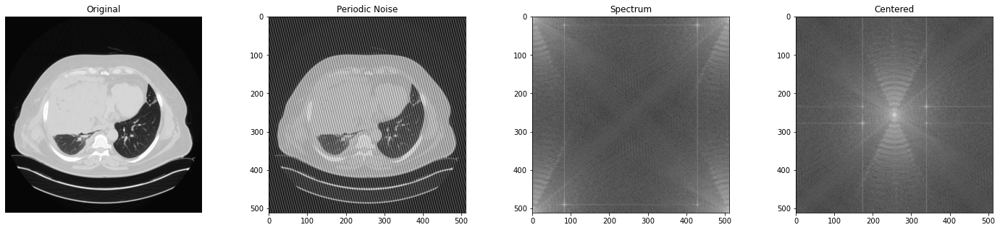

In [6]:
periodic = add_periodic(img_base).astype(int)
freq = np.fft.fft2(periodic)
center_freq = np.fft.fftshift(freq)

fig=plt.figure(figsize=(25, 5))

fig.add_subplot(1,4,1)
plt.imshow(img_base,cmap='gray')
plt.axis("off")
plt.title("Original")

fig.add_subplot(1,4,2)
plt.imshow(periodic,cmap='gray')
plt.title("Periodic Noise")

fig.add_subplot(1,4,3)
plt.imshow(np.log(1+np.abs(freq)),cmap='gray')
plt.title("Spectrum")

fig.add_subplot(1,4,4)
plt.imshow(np.log(1+np.abs(center_freq)),cmap='gray')
plt.title("Centered")

#### Notch Filter

In [7]:
def notch_reject_filter(shape, d0, u_k=0, v_k=0):
    P, Q = shape
    # Initialize filter with zeros
    H = np.zeros((P, Q))

    # Traverse through filter
    for u in range(0, P):
        for v in range(0, Q):
            # Get euclidean distance from point D(u,v) to the center
            D_uv = np.sqrt((u - P / 2 + u_k) ** 2 + (v - Q / 2 + v_k) ** 2)
            D_muv = np.sqrt((u - P / 2 - u_k) ** 2 + (v - Q / 2 - v_k) ** 2)

            if D_uv <= d0 or D_muv <= d0:
                H[u, v] = 0.0
            else:
                H[u, v] = 1.0
    return H

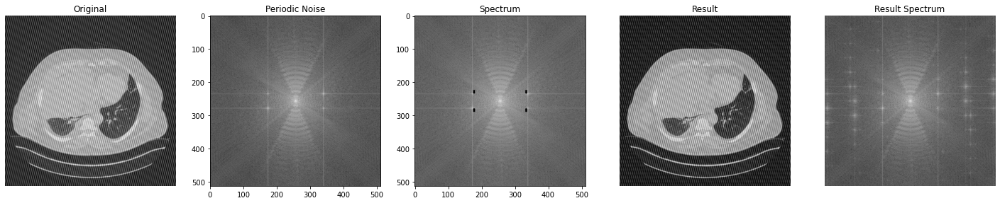

In [8]:
phase_spectrumr = np.angle(center_freq)

magnitude_spectrum = 20*np.log(np.abs(center_freq))

img_shape = periodic.shape

H1 = notch_reject_filter(img_shape, 3, 25, -78)
H2 = notch_reject_filter(img_shape, 3, 25, 78)
H3 = notch_reject_filter(img_shape, 3, -30,-78)
H4 = notch_reject_filter(img_shape, 3, -30, 78)

NotchFilter = np.multiply(H1,np.multiply(H2, np.multiply(H3, H4)))
# H1*H2*H3*H4
NotchRejectCenter = np.multiply(freq, NotchFilter) 
NotchReject = np.fft.ifftshift(NotchRejectCenter)
inverse_NotchReject = np.fft.ifft2(NotchReject)  # Compute the inverse DFT of the result
Result = np.abs(inverse_NotchReject)

result_fft = np.fft.fft2(Result)
result_center = np.fft.fftshift(result_fft)

fig=plt.figure(figsize=(25, 5))

fig.add_subplot(1,5,1)
plt.imshow(periodic,cmap='gray')
plt.axis("off")
plt.title("Original")

fig.add_subplot(1,5,2)
plt.imshow(magnitude_spectrum,cmap='gray')
plt.title("Periodic Noise")

fig.add_subplot(1,5,3)
plt.imshow(magnitude_spectrum * NotchFilter,cmap='gray')
plt.title("Spectrum")

fig.add_subplot(1,5,4)
plt.imshow(Result,cmap='gray')
plt.axis("off")
plt.title("Result")

fig.add_subplot(1,5,5)
plt.imshow(np.log(1+np.abs(result_center)),cmap='gray')
plt.axis("off")
plt.title("Result Spectrum")


plt.show()

### Salt and Pepper Noise

In [9]:
import random
def add_noise_salt_pepeer(img):
    # Getting the dimensions of the image
    row,col = img.shape
    
    # Randomly pick some pixels in the
    # image for coloring them white
    # Pick a random number between 300 and 10000
    number_of_pixels = random.randint(300, 10000)
    for i in range(number_of_pixels):
        # Pick a random y coordinate
        y_coord=random.randint(0, row - 1)
        # Pick a random x coordinate
        x_coord=random.randint(0, col - 1)
        # Color that pixel to white
        img[y_coord][x_coord] = 255
    # Randomly pick some pixels in
    # the image for coloring them black
    # Pick a random number between 300 and 10000
    number_of_pixels = random.randint(300 , 10000)
    for i in range(number_of_pixels):
        # Pick a random y coordinate
        y_coord=random.randint(0, row - 1)
        # Pick a random x coordinate
        x_coord=random.randint(0, col - 1)
        # Color that pixel to black
        img[y_coord][x_coord] = 0
    return img

Text(0.5, 1.0, 'Median Filter')

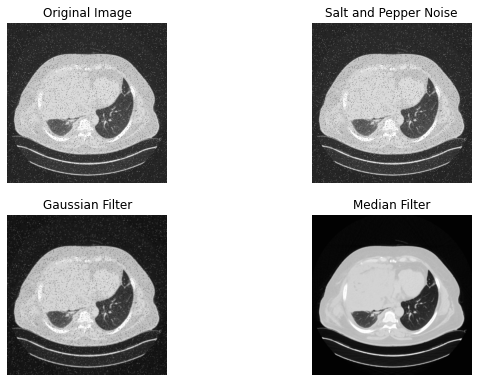

In [10]:
img_salt_pepper = add_noise_salt_pepeer(img_base)

#Denoising Image using Median Filter and Gaussian Filter
gaussian_filter = cv2.GaussianBlur(img_salt_pepper,(3,3),1)
median_filter_apply = cv2.medianBlur(img_salt_pepper,3)

fig = plt.figure(figsize=(10, 10)) 

fig.add_subplot(3,2,1)
plt.imshow(img_base,cmap='gray')
plt.axis("off")
plt.title("Original Image")

fig.add_subplot(3,2,2)
plt.imshow(img_salt_pepper,cmap='gray')
plt.axis("off")
plt.title("Salt and Pepper Noise")

fig.add_subplot(3,2,3)
plt.imshow(gaussian_filter,cmap='gray')
plt.axis("off")
plt.title("Gaussian Filter")

fig.add_subplot(3,2,4)
plt.imshow(median_filter_apply,cmap='gray')
plt.axis("off")
plt.title("Median Filter")

In [11]:
print("PSNR of Gaussian Blur: ",psnr(gaussian_filter, img_salt_pepper))
print("PSNR of Median Filter: ",psnr(median_filter_apply, img_salt_pepper))
print()
print("RMSE of Gaussian Blur: ",rmsdiff(img_salt_pepper, gaussian_filter))
print("RMSE of Median Filter: ",rmsdiff(img_salt_pepper, median_filter_apply))
print()
print("PSNR - Higher the better hence Median Filter is preferred")
print("RMSE - Lower the better hence Median Filter is preferred")

PSNR of Gaussian Blur:  33.00545563736272
PSNR of Median Filter:  37.74066122103761

RMSE of Gaussian Blur:  5.70515435052638
RMSE of Median Filter:  3.3075553408467213

PSNR - Higher the better hence Median Filter is preferred
RMSE - Lower the better hence Median Filter is preferred


### Gaussian Noise 

Text(0.5, 1.0, 'Median Filter')

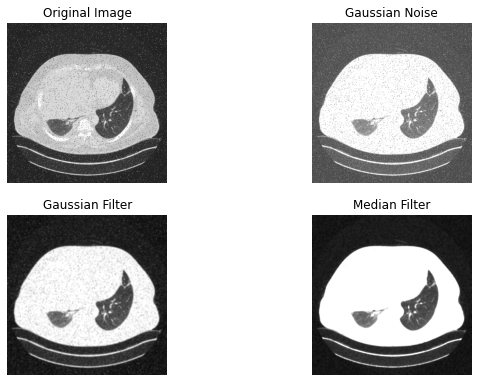

In [12]:
gauss_noise = np.zeros((img_base.shape[0],img_base.shape[1]),dtype=np.uint8)
cv2.randn(gauss_noise,128,20)
gauss_noise = (gauss_noise*0.5).astype(np.uint8)

#Adding Gaussian Noise to the Image
img_gauss = cv2.add(img_base,gauss_noise)

#Denoising the Image using Gaussain Blur and Median Filter
gaussian_blur = cv2.GaussianBlur(img_gauss,(5,5),2)
median_filter = cv2.medianBlur(img_gauss,5)

fig = plt.figure(figsize=(10, 10)) 

fig.add_subplot(3,2,1)
plt.imshow(img_base,cmap='gray')
plt.axis("off")
plt.title("Original Image")

fig.add_subplot(3,2,2)
plt.imshow(img_gauss,cmap='gray')
plt.axis("off")
plt.title("Gaussian Noise")

fig.add_subplot(3,2,3)
plt.imshow(gaussian_blur,cmap='gray')
plt.axis("off")
plt.title("Gaussian Filter")

fig.add_subplot(3,2,4)
plt.imshow(median_filter,cmap='gray')
plt.axis("off")
plt.title("Median Filter")

In [13]:
print("PSNR of Gaussian Blur: ",psnr(gaussian_blur, img_gauss))
print("PSNR of Median Filter: ",psnr(median_filter, img_gauss))
print()
print("RMSE of Gaussian Blur: ",rmsdiff(img_gauss, gaussian_blur))
print("RMSE of Median Blur: ",rmsdiff(img_gauss, median_filter))
print()
print("There isn't much difference to using Median Filter or Gaussian Filter for Gaussian Noise from the values")

PSNR of Gaussian Blur:  30.2352760375952
PSNR of Median Filter:  31.86320975683571

RMSE of Gaussian Blur:  7.848314150418681
RMSE of Median Blur:  6.506983306924323

There isn't much difference to using Median Filter or Gaussian Filter for Gaussian Noise from the values


#### Homomorphic Filtering

Steps:
1. Take Log of Image
2. Perform DFT
3. Apply a filter (Multiplication)
4. Inverse DFT
5. Take Exponenet (Reverse Log)

In order to come to a conclusive Kernal Size and D0 to implement Homomorphic Filter, we took a range of values and compared their PSNR and RMSE values to come to a conclusion.

In [14]:
image_path = r'C:/Users/Saisid/Downloads/College/Semester 5/19CSE431 - Digital Image Processing/Additional Files/Lung Cancer Datasets/Dataset - Kaggle/Image Dataset/Cancer/cancer_3.jpg'

In [15]:
psnr_val = []
rmse_val = []

max_indices_psnr = []
min_indices_rmse = []

max_value_psnr = []
min_value_rmse = []

ksize_arr = [3,5,7,9,11,13,15,17,19,21,23,25,31,35,41]
for ksize in ksize_arr:
    psnr_val = []
    rmse_val = []
    for radius in range(1, 50):
        img_base = cv2.imread(image_path,0)
        hh, ww = img_base.shape[:2]
        img_log = np.log(np.float64(img_base), dtype=np.float64)
        dft = np.fft.fft2(img_log, axes=(0,1))
        dft_shift = np.fft.fftshift(dft)
        mask = np.zeros_like(img_base, dtype=np.float64)
        cy = mask.shape[0] // 2
        cx = mask.shape[1] // 2
        cv2.circle(mask, (cx,cy), radius, 1, -1)
        mask = 1 - mask
        mask = cv2.GaussianBlur(mask, (ksize, ksize), 0)
        dft_shift_filtered = np.multiply(dft_shift,mask)
        back_ishift = np.fft.ifftshift(dft_shift_filtered)
        img_back = np.fft.ifft2(back_ishift, axes=(0,1))
        img_back = np.abs(img_back)
        img_homomorphic = np.exp(img_back, dtype=np.float64)
        img_homomorphic = cv2.normalize(img_homomorphic, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
        psnr_val.append(psnr(img_homomorphic, img_base))
        rmse_val.append(rmsdiff(img_base, img_homomorphic)) 
    #Finding Max PSNR
    max_valuepsnr = max(psnr_val)
    index_psnr = psnr_val.index(max_valuepsnr)
    max_indices_psnr.append(index_psnr)
    max_value_psnr.append(max_valuepsnr)

    #Finding Min RMSE
    min_valuermse = min(rmse_val)
    index_rmse = rmse_val.index(min_valuermse)
    min_indices_rmse.append(index_rmse)
    min_value_rmse.append(min_valuermse)

Index -> Corresponds to the Kernal Size  
Value retrieved from Indices array -> Radius Chosen

In [16]:
max_indices_psnr

[1, 2, 2, 0, 2, 2, 3, 0, 0, 4, 5, 3, 1, 8, 9]

In [17]:
max_value_psnr

[27.78942310870751,
 27.576268048215816,
 27.54029476732613,
 27.84708364534371,
 28.05314733816248,
 27.603762147178124,
 28.247047787127563,
 28.476386784786133,
 28.263301813416003,
 28.1132891972953,
 28.008268159821167,
 28.32368377819552,
 28.518807419354726,
 28.343533264759916,
 28.73345086153057]

In [18]:
best_value = max(max_value_psnr)
index_bestvalue_kernal = max_value_psnr.index(best_value)
index_bestvalue_radius = max_indices_psnr[max_value_psnr.index(best_value)] + 1
#Adding 1 because Radius start from 1 and not 0
print("Kernal Size chosen is" ,ksize_arr[index_bestvalue_kernal],"corresponding to the Max PSNR from the calculated values")
print("Radius Value chosen is: ", index_bestvalue_radius)

Kernal Size chosen is 41 corresponding to the Max PSNR from the calculated values
Radius Value chosen is:  10


In [19]:
min_indices_rmse

[1, 2, 2, 0, 2, 2, 3, 0, 0, 4, 5, 3, 1, 8, 9]

In [20]:
min_value_rmse

[10.400854596458405,
 10.659253186659676,
 10.703490848275218,
 10.33203808039708,
 10.08980594263145,
 10.62556599624126,
 9.867060499665174,
 9.609943652191255,
 9.848613397430665,
 10.020184554724638,
 10.142073940686855,
 9.780385914620958,
 9.563124492922732,
 9.75806074231369,
 9.329699103930043]

Hence, Radius is chosen as 10 and Kernal Size is taken as 41

Text(0.5, 1.0, 'Performing Log Transform')

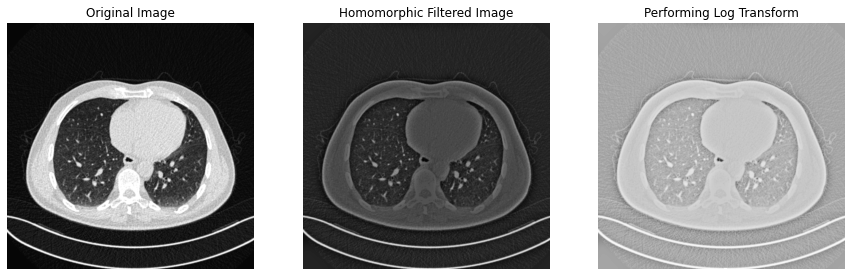

In [21]:
hh, ww = img_base.shape[:2]
img_log = np.log(np.float64(img_base), dtype=np.float64)
dft = np.fft.fft2(img_log, axes=(0,1))
dft_shift = np.fft.fftshift(dft)
radius = 10
mask = np.zeros_like(img_base, dtype=np.float64)
cy = mask.shape[0] // 2
cx = mask.shape[1] // 2
cv2.circle(mask, (cx,cy), radius, 1, -1)
mask = 1 - mask
mask = cv2.GaussianBlur(mask, (41,41), 0)
dft_shift_filtered = np.multiply(dft_shift,mask)
back_ishift = np.fft.ifftshift(dft_shift_filtered)
img_back = np.fft.ifft2(back_ishift, axes=(0,1))
img_back = np.abs(img_back)
img_homomorphic = np.exp(img_back, dtype=np.float64)
img_homomorphic = cv2.normalize(img_homomorphic, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)

fig = plt.figure(figsize=(15, 15)) 

fig.add_subplot(1,3,1)
plt.imshow(img_base,cmap='gray')
plt.axis("off")
plt.title("Original Image")

fig.add_subplot(1,3,2)
plt.imshow(img_homomorphic,cmap='gray')
plt.axis("off")
plt.title("Homomorphic Filtered Image")

fig.add_subplot(1,3,3)
plt.imshow(np.log(1+np.abs(img_homomorphic)),cmap='gray')
plt.axis("off")
plt.title("Performing Log Transform")

### Uniform Noise

In [22]:
def gaussian_kernel(kernel_size = 3):
    h = gaussian(kernel_size, kernel_size / 3).reshape(kernel_size, 1)
    h = np.dot(h, h.transpose())
    h /= np.sum(h)
    return h

def wiener_filter(img, kernel, K):
    kernel /= np.sum(kernel)
    dummy = np.copy(img)
    dummy = fft2(dummy)
    kernel = fft2(kernel, s = img.shape)
    kernel = np.conj(kernel) / (np.abs(kernel) ** 2 + K)
    dummy = dummy * kernel
    dummy = np.abs(ifft2(dummy))
    return dummy

Text(0.5, 1.0, 'Wiener Filter')

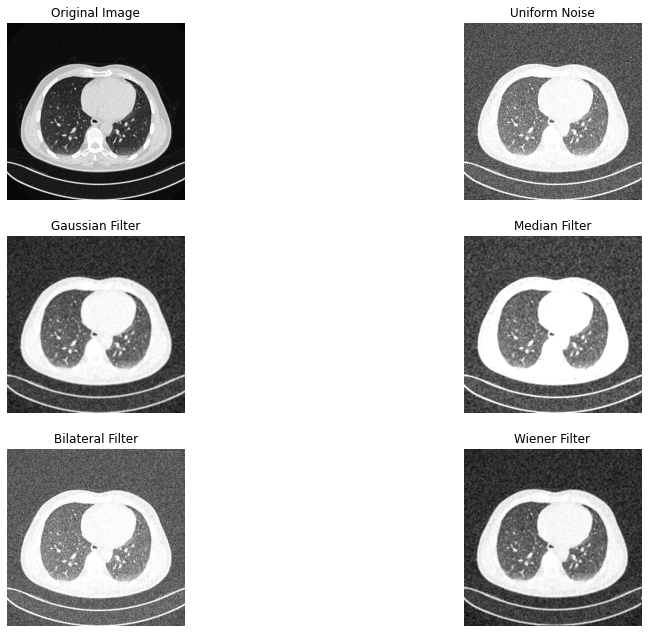

In [23]:
uni_noise = np.zeros(img_base.shape,dtype=np.uint8)
cv2.randu(uni_noise,0,255)
uni_noise =(uni_noise * 0.5).astype(np.uint8)

#Adding Uniform Noise
uniform_noise = cv2.add(img_base,uni_noise)

#Denoising using Gaussian, Median, Bilateral and Weiner filter
gaussian_filter = cv2.GaussianBlur(uniform_noise,(5,5),2)
median_filter = cv2.medianBlur(uniform_noise,5)
bilateral_filter = cv2.bilateralFilter(uniform_noise, 5, 20, 100, borderType=cv2.BORDER_CONSTANT)
kernel = gaussian_kernel(5)
wiener_filter = wiener_filter(uniform_noise, kernel, K = 10)

fig = plt.figure(figsize=(15, 15)) 

fig.add_subplot(4,2,1)
plt.imshow(img_base,cmap='gray')
plt.axis("off")
plt.title("Original Image")

fig.add_subplot(4,2,2)
plt.imshow(uniform_noise,cmap='gray')
plt.axis("off")
plt.title("Uniform Noise")

fig.add_subplot(4,2,3)
plt.imshow(gaussian_filter,cmap='gray')
plt.axis("off")
plt.title("Gaussian Filter")

fig.add_subplot(4,2,4)
plt.imshow(median_filter,cmap='gray')
plt.axis("off")
plt.title("Median Filter")

fig.add_subplot(4,2,5)
plt.imshow(bilateral_filter,cmap='gray')
plt.axis("off")
plt.title("Bilateral Filter")

fig.add_subplot(4,2,6)
plt.imshow(wiener_filter ,cmap='gray')
plt.axis("off")
plt.title("Wiener Filter")

In [24]:
print("PSNR of Gaussian Blur: ",psnr(gaussian_filter, img_base))
print("PSNR of Median Filter: ",psnr(median_filter, img_base))
print("PSNR of Bilateral Filter: ",psnr(bilateral_filter, img_base))
print("PSNR of Wiener Filter: ",psnr(wiener_filter, img_base))
print()
print("RMSE of Gaussian Blur: ",rmsdiff(img_base, gaussian_filter))
print("RMSE of Median Blur: ",rmsdiff(img_base, median_filter))
print("RMSE of Bilateral Blur: ",rmsdiff(img_base, bilateral_filter))
print("RMSE of Wiener Blur: ",rmsdiff(img_base, wiener_filter))
print()
print("In the case of Uniform Noise, Except for Wiener Filter, all other filters have comparable PSNR and RMSE values")

PSNR of Gaussian Blur:  27.87905441685854
PSNR of Median Filter:  27.681170203507826
PSNR of Bilateral Filter:  27.56191553678476
PSNR of Wiener Filter:  7.171743050793712

RMSE of Gaussian Blur:  10.29407811710237
RMSE of Median Blur:  10.531292380408976
RMSE of Bilateral Blur:  10.676881032128192
RMSE of Wiener Blur:  111.67424574325197

In the case of Uniform Noise, Except for Wiener Filter, all other filters have comparable PSNR and RMSE values


### Speckle Noise

Text(0.5, 1.0, 'Homomorphic Filter')

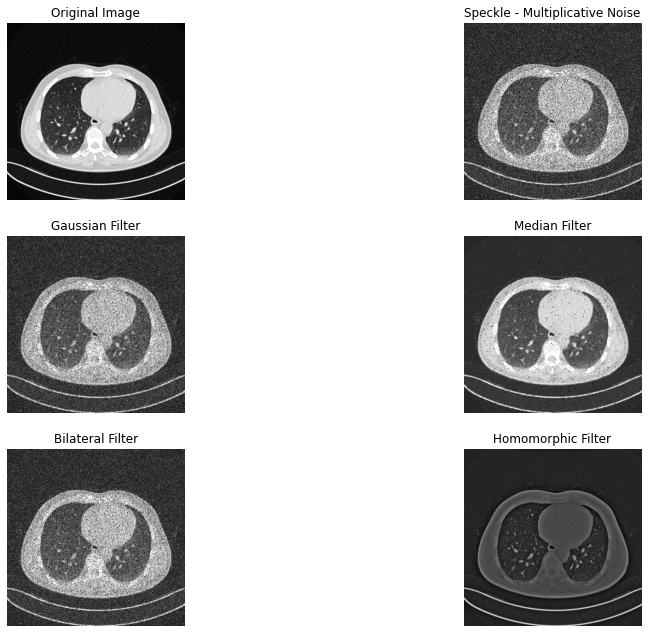

In [25]:
# #Adding Speckle Noise to the Image
gauss = np.random.normal(0,1,img_base.size)
gauss = gauss.reshape(img_base.shape[0],img_base.shape[1]).astype('uint8')
speck_img = img_base + img_base * gauss

#Denoising
#Comparing Mean Filter, Median Filter, Bilateral Filter, Weiner Filter
gaussian_filt = cv2.GaussianBlur(speck_img,(5,5),0.5)
median_filt = cv2.medianBlur(speck_img,3)
bilateral_filt = cv2.bilateralFilter(speck_img, 5, 20, 20, borderType=cv2.BORDER_CONSTANT)
kernel = gaussian_kernel(5)

hh, ww = speck_img.shape[:2]
img_log = np.log(np.float64(img_base), dtype=np.float64)
dft = np.fft.fft2(img_log, axes=(0,1))
dft_shift = np.fft.fftshift(dft)
mask = np.zeros_like(img_base, dtype=np.float64)
cy = mask.shape[0] // 2
cx = mask.shape[1] // 2
cv2.circle(mask, (cx,cy), 10, 1, -1)
mask = 1 - mask
mask = cv2.GaussianBlur(mask, (41, 41), 0)
dft_shift_filtered = np.multiply(dft_shift,mask)
back_ishift = np.fft.ifftshift(dft_shift_filtered)
img_back = np.fft.ifft2(back_ishift, axes=(0,1))
img_back = np.abs(img_back)
img_homomorphic_speck = np.exp(img_back, dtype=np.float64)
img_homomorphic_speck = cv2.normalize(img_homomorphic_speck, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)

fig = plt.figure(figsize=(15, 15)) 

fig.add_subplot(4,2,1)
plt.imshow(img_base,cmap='gray')
plt.axis("off")
plt.title("Original Image")

fig.add_subplot(4,2,2)
plt.imshow(speck_img,cmap='gray')
plt.axis("off")
plt.title("Speckle - Multiplicative Noise")

fig.add_subplot(4,2,3)
plt.imshow(gaussian_filt,cmap='gray')
plt.axis("off")
plt.title("Gaussian Filter")

fig.add_subplot(4,2,4)
plt.imshow(median_filt,cmap='gray')
plt.axis("off")
plt.title("Median Filter")

fig.add_subplot(4,2,5)
plt.imshow(bilateral_filt,cmap='gray')
plt.axis("off")
plt.title("Bilateral Filter")

fig.add_subplot(4,2,6)
plt.imshow(img_homomorphic_speck,cmap='gray')
plt.axis("off")
plt.title("Homomorphic Filter")

In [26]:
print("PSNR of Gaussian Blur: ",psnr(gaussian_filt, speck_img))
print("PSNR of Median Filter: ",psnr(median_filt, speck_img))
print("PSNR of Bilateral Filter: ",psnr(bilateral_filt, speck_img))
print("PSNR of Homomorphic Filter: ",psnr(img_homomorphic_speck, speck_img))
print()
print("RMSE of Gaussian Blur: ",rmsdiff(speck_img, gaussian_filter))
print("RMSE of Median Blur: ",rmsdiff(speck_img, median_filt))
print("RMSE of Bilateral Blur: ",rmsdiff(speck_img, bilateral_filt))
print("RMSE of Homomorphic Blur: ",rmsdiff(speck_img, img_homomorphic_speck))
print()

PSNR of Gaussian Blur:  29.81945123945583
PSNR of Median Filter:  30.934752226747708
PSNR of Bilateral Filter:  33.82378431632029
PSNR of Homomorphic Filter:  28.327919392875867

RMSE of Gaussian Blur:  10.1974365827941
RMSE of Median Blur:  7.241067052789131
RMSE of Bilateral Blur:  5.1921946412736775
RMSE of Homomorphic Blur:  9.77561773899507



In [27]:
print("PSNR of Gaussian Blur: 29.832987881350782")
print("PSNR of Median Filter: 30.950057344966094")
print()
print("RMSE of Gaussian Blur: 10.196438852113642")
print("RMSE of Median Blur: 7.228319043277368")

PSNR of Gaussian Blur: 29.832987881350782
PSNR of Median Filter: 30.950057344966094

RMSE of Gaussian Blur: 10.196438852113642
RMSE of Median Blur: 7.228319043277368


## Frequency Domain Filtering

#### Original Image -> Fourier Transform -> Inverse FFT -> Original Image

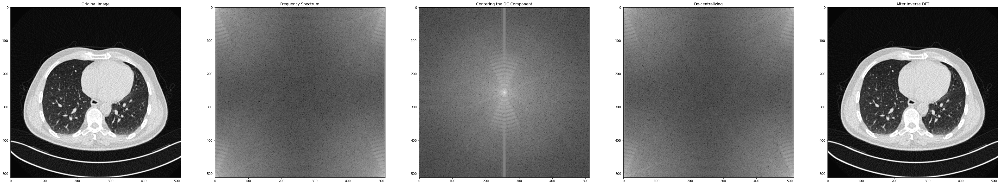

In [28]:
plt.figure(figsize=(8*7, 8*7), constrained_layout=False)

plt.subplot(151), plt.imshow(img_base, "gray"), plt.title("Original Image")

original = np.fft.fft2(img_base)
plt.subplot(152), plt.imshow(np.log(1+np.abs(original)), "gray"), plt.title("Frequency Spectrum")

center = np.fft.fftshift(original)
plt.subplot(153), plt.imshow(np.log(1+np.abs(center)), "gray"), plt.title("Centering the DC Component")

inv_center = np.fft.ifftshift(center)
plt.subplot(154), plt.imshow(np.log(1+np.abs(inv_center)), "gray"), plt.title("De-centralizing")

processed_img = np.fft.ifft2(inv_center)
plt.subplot(155), plt.imshow(np.abs(processed_img), "gray"), plt.title("After Inverse DFT")

plt.show()

Original image to Frequency spectrum to centralising the low frequencies (DC component) to decentralising to idft to original image 

#### Phase Angle and Spectrum

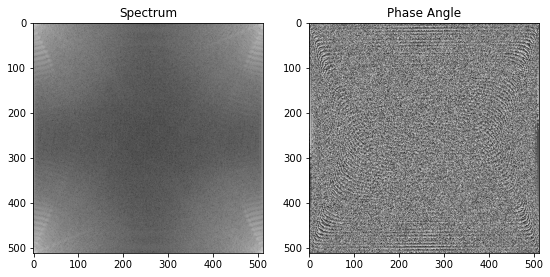

In [29]:
plt.figure(figsize=(14, 14), constrained_layout=False)

original = np.fft.fft2(img_base)
plt.subplot(131), plt.imshow(np.log(np.abs(original)), "gray"), plt.title("Spectrum")

plt.subplot(132), plt.imshow(np.angle(original), "gray"), plt.title("Phase Angle")
plt.show()

### Mathematical Representation for Different Types of Low and High Pass Filters  
#### Low Pass Filters  
1. Ideal Low Pass Filter
<img src="https://static.javatpoint.com/tutorial/dip/images/dip-high-pass-vs-low-pass-filters2.png"  width="200" height="200">
2. Butterworth Low Pass Filter
<img src="https://static.javatpoint.com/tutorial/dip/images/dip-high-pass-vs-low-pass-filters5.png"  width="200" height="200">
3. Gaussian Low Pass Filter  
<img src="https://static.javatpoint.com/tutorial/dip/images/dip-high-pass-vs-low-pass-filters7.png"  width="200" height="200">

#### High Pass Filters  
1. Ideal High Pass Filter
<img src="https://i.postimg.cc/brRpcZ2v/Screenshot-from-2022-12-12-20-27-13.png"  width="200" height="200">
2. Butterworth High Pass Filter
<img src="https://i.postimg.cc/0NJ6gC52/Screenshot-from-2022-12-12-20-35-54.png"  width="200" height="200">
3. Gaussian High Pass Filter
<img src="https://i.postimg.cc/k4JdNnH3/Screenshot-from-2022-12-12-20-37-14.png"  width="200" height="200">   

  
  
Where D(u,v) is the Euclidean Distance from point (u,v) to the origin which is given by:  

<img src="https://static.javatpoint.com/tutorial/dip/images/dip-high-pass-vs-low-pass-filters3.png" width="200" height="200">  

#### User-Defined Functions for Implementing each type of Filter 

In [30]:
#Euclidean Distance
def distance(point1,point2):
    return sqrt((point1[0]-point2[0])**2 + (point1[1]-point2[1])**2)


def idealFilterLP(D0,imgShape):
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            if distance((y,x),center) < D0:
                base[y,x] = 1
    return base

def idealFilterHP(D0,imgShape):
    base = np.ones(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            if distance((y,x),center) < D0:
                base[y,x] = 0
    return base

def gaussianLP(D0,imgShape):
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            base[y,x] = exp(((-distance((y,x),center)**2)/(2*(D0**2))))
    return base

def gaussianHP(D0,imgShape):
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            base[y,x] = 1 - exp(((-distance((y,x),center)**2)/(2*(D0**2))))
    return base
      
def butterworthLP(D0,imgShape,n):
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            base[y,x] = 1/(1+(distance((y,x),center)/D0)**(2*n))
    return base

def butterworthHP(D0,imgShape,n):
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            base[y,x] = 1-1/(1+(distance((y,x),center)/D0)**(2*n))
    return base

### Filter Implementation in Frequency Domain
##### Steps:
1. Convert to Fourier Domain
2. Center the Low Frequencies(DC Component)
3. Multiply the Center with the Filter 
4. De-center the DC Component to the sides
5. Apply IDFT to get the Filtered Image in Spatial Domain

In [31]:
def low_pass(d0, choice, type_filter, n, img_base):
    original = np.fft.fft2(img_base)

    center = np.fft.fftshift(original)

    #Since Convolution is multiplication in the Frequency Domain, we multiply it with the Centred Spectrum
    LowPassCenter = []
    if(type_filter == 'ILPF'):
        LowPassCenter = center * idealFilterLP(d0,img_base.shape)
    elif(type_filter == 'BLPF'):
        LowPassCenter = center * butterworthLP(d0,img_base.shape,n)
    elif(type_filter == 'GLPF'):
        LowPassCenter = center * gaussianLP(d0,img_base.shape)

    LowPass = np.fft.ifftshift(LowPassCenter)

    inverse_LowPass = np.fft.ifft2(LowPass)

    if(choice == 0):
        plt.figure(figsize=(25, 5), constrained_layout=False)


        plt.subplot(161), plt.imshow(img_base, "gray"), plt.title("Original Image")

        plt.subplot(162), plt.imshow(np.log(1+np.abs(original)), "gray"), plt.title("Spectrum")

        plt.subplot(163), plt.imshow(np.log(1+np.abs(center)), "gray"), plt.title("Centered Spectrum")
        
        if(type_filter == 'ILPF'):
            plt.subplot(164), plt.imshow(np.log(1+np.abs(LowPassCenter)), "gray"), plt.title("Centered Spectrum multiply ILPF")
        elif(type_filter == 'BLPF'):
            plt.subplot(164), plt.imshow(np.log(1+np.abs(LowPassCenter)), "gray"), plt.title("Centered Spectrum multiply BLPF")
        elif(type_filter == 'GLPF'):
            plt.subplot(164), plt.imshow(np.log(1+np.abs(LowPassCenter)), "gray"), plt.title("Centered Spectrum multiply GLPF")

        plt.subplot(165), plt.imshow(np.log(1+np.abs(LowPass)), "gray"), plt.title("Decentralize")

        plt.subplot(166), plt.imshow(np.abs(inverse_LowPass), "gray"), plt.title("Processed Image")

        plt.suptitle("D0:"+str(d0),fontweight="bold")
        plt.subplots_adjust(top=1.1)
        plt.show()
    else:
        plt.imshow(np.abs(inverse_LowPass), "gray")
        if(type_filter == 'ILPF'):
            plt.title("ILPF with D0 = " +str(d0))
        elif(type_filter == 'BLPF'):
            plt.title("BLPF with n = " +str(n))
        elif(type_filter == 'GLPF'):
            plt.title("GLPF with D0 = " +str(d0))
        plt.show()
        
#This is the same function but returns the Filtered Image
def apply_low_pass(img_base, d0, type_filter, n):
    # perform FFT
    original = np.fft.fft2(img_base)
    
    # get spectrum
    center = np.fft.fftshift(original)
    
    # center spectrum for low pass
    LowPassCenter = []
    if(type_filter == 'ILPF'):
        LowPassCenter = center * idealFilterLP(d0,img_base.shape)
    elif(type_filter == 'BLPF'):
        LowPassCenter = center * butterworthLP(d0,img_base.shape,n)
    elif(type_filter == 'GLPF'):
        LowPassCenter = center * gaussianLP(d0,img_base.shape)
    # perform low pass
    LowPass = np.fft.ifftshift(LowPassCenter)
    
    # reverse FFT -> IFFT
    inverse_LowPass = np.fft.ifft2(LowPass)
    
    # add filter to original image
    output_img = img_base + np.abs(inverse_LowPass)
    
    return output_img

#### Ideal Low Pass Filter

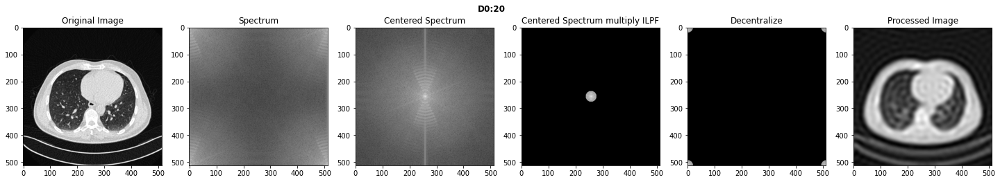

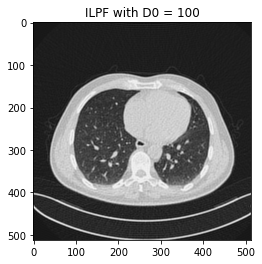

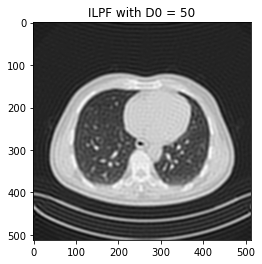

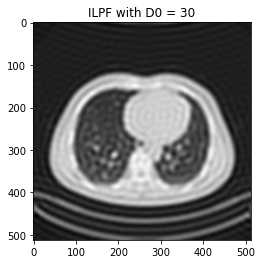

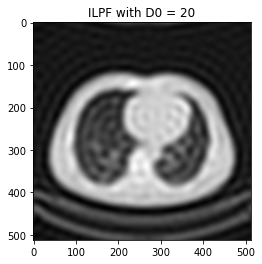

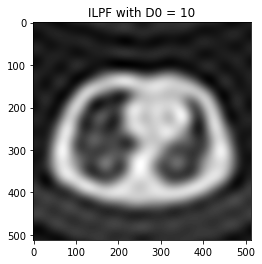

In [32]:
low_pass(20, 0, 'ILPF', 0, img_base)
for i in [100,50,30,20,10]:
    low_pass(i, 1, 'ILPF', 0, img_base)

We can notice over here that , as we decrease the D0 value that is the radius or the cut off frequency of the mask the ripple or the ringing effect increases , is due to the sharp cut-off transition at the cutoff frequency. When a frequency close to the cutoff frequency is applied to the filter, the signal is reflected back and forth causing an oscillatory effect. This is known as ringing or ripple.

Over here we can see that for D0 value <=50 , for cancer image 3 the ringing effects starts. The ringing effect is less or negligible for D0 = 100.
So we mostly avoid the use of Ideal Low Pass filters because of the ripple or ringing effect , and it is really hard to diffrentiate for the non cancerous and the image which has cancer because of intense blurring of the image.

#### Butterworth Low Pass Filter

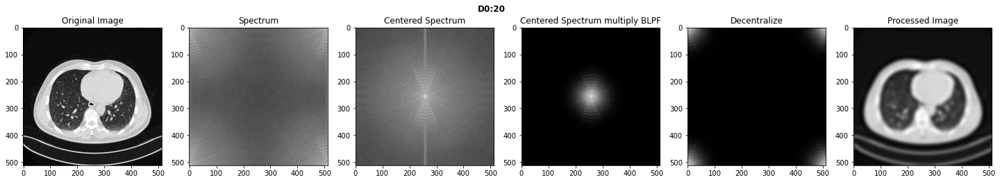

D0 =  100


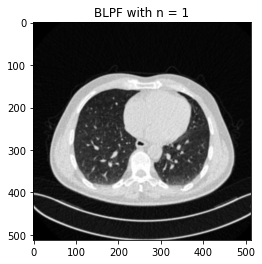

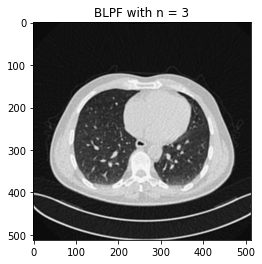

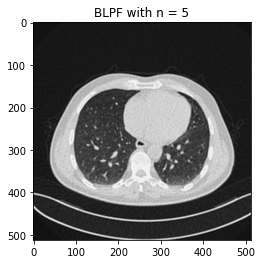

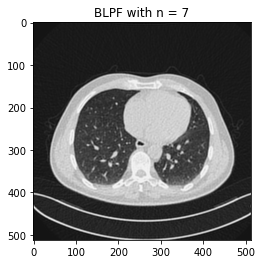

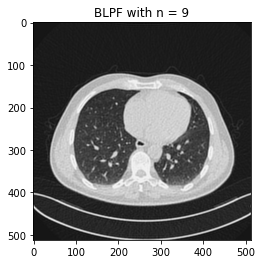

D0 =  50


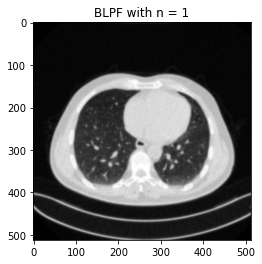

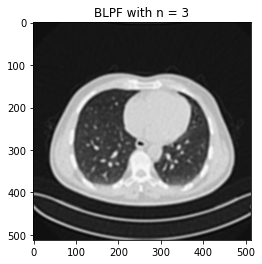

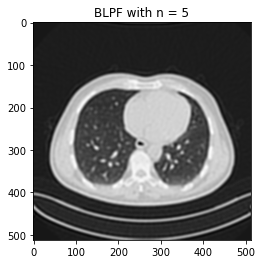

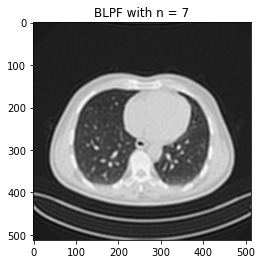

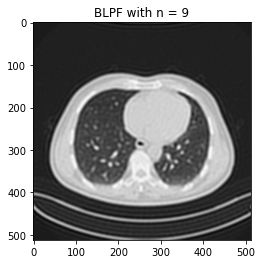

D0 =  30


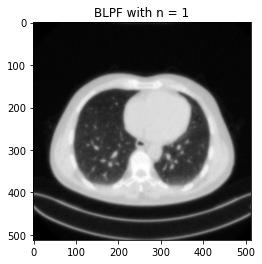

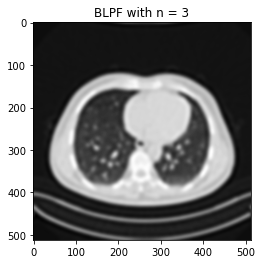

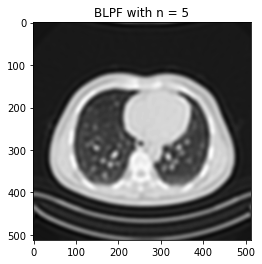

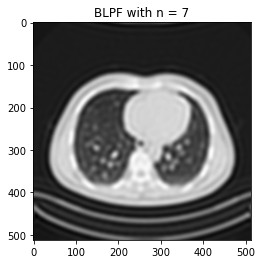

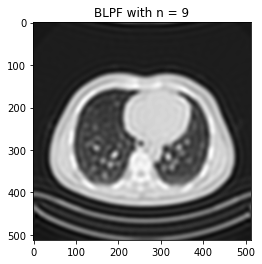

D0 =  20


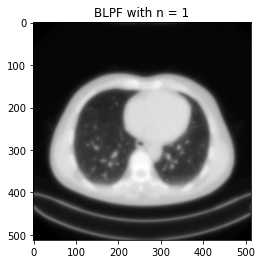

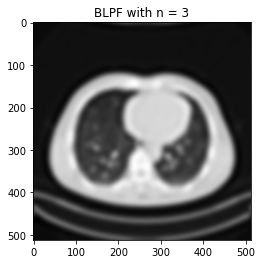

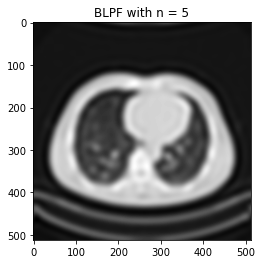

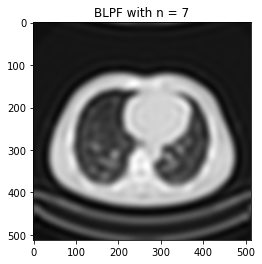

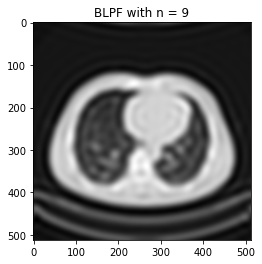

D0 =  10


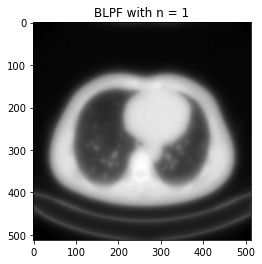

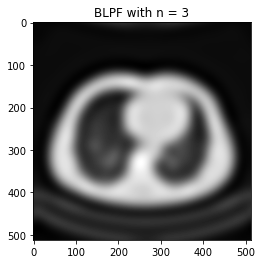

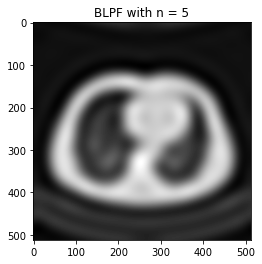

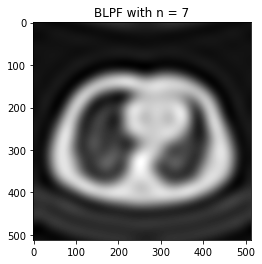

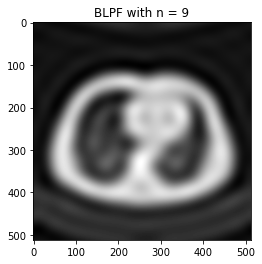

In [33]:
low_pass(20, 0, 'BLPF', 3, img_base)
for i in [100,50,30,20,10]:
    print('D0 = ', i)
    for j in range(1, 10, 2):
        low_pass(i, 1, 'BLPF', j, img_base)   

Over here in Butterworth Low Pass filter the Greater D0 value that is close too 100 or >=50 , the Filter acts as a Gaussian Low Pass filter with Negligible ripple or ringing effects. The transistion between the passband and the stopband is very smooth for higher values of the D0. 

As we reduced the value of the D0 that is the value such as D0 = 30 or D0 = 10 and as we increase the order(n) from 1 to 9 , we can notice the ringing or the ripple effect and the Butterworth Low Pass Filter starts acting as the Ideal Low Pass Filter. 

Hence for Higher D0 values Butterworth Low Pass filter is the best with no ringing effect.and its frequency response is maximally flat in the passband. However, its transition from the passband to the stopband is not as sharp as the ideal low pass filter.

#### Gaussian Low Pass Filter

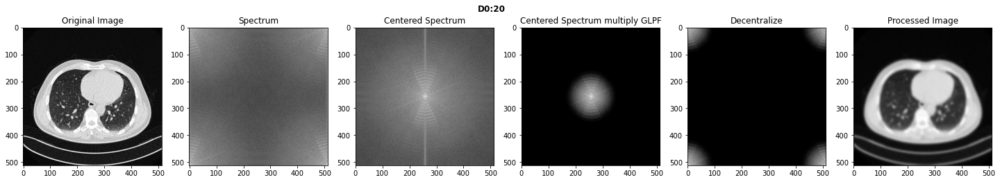

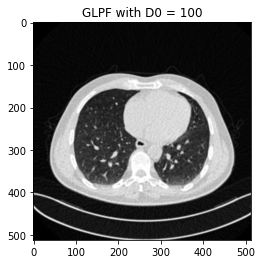

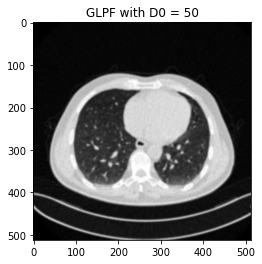

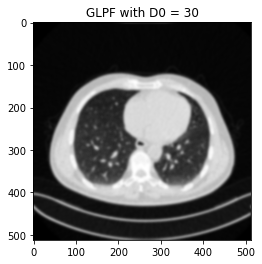

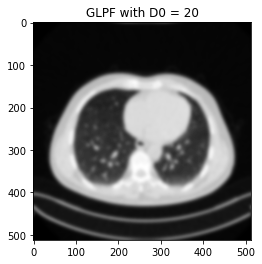

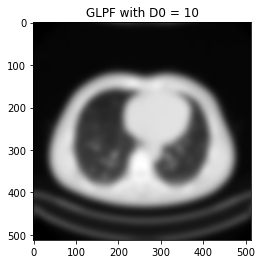

In [34]:
low_pass(20, 0, 'GLPF', 0, img_base)
for i in [100,50,30,20,10]:
    low_pass(i, 1, 'GLPF', 0, img_base)

The Gaussian low pass filter is an infinite impulse response filter and provides the smoothest transition between the passband and the stopband. It has a frequency response that is shaped like a bell and provides a gentler roll-off than both the ideal and Butterworth low pass filters.

Because of the Smooth transition between the passband and stopband there is literally no ripple or ringing effect in Guassian Low Pa
ss Filter. 
We can see here that for D0 value <=50 the Image is smoothened alot that is , it is blurred out perfectly.

In [35]:
def high_pass(d0, choice, type_filter, n, img_base):
    original = np.fft.fft2(img_base)

    center = np.fft.fftshift(original)

    #Since Convolution is multiplication in the Frequency Domain, we multiply it with the Centred Spectrum
    HighPassCenter = []
    if(type_filter == 'IHPF'):
        HighPassCenter = center * idealFilterHP(d0,img_base.shape)
    elif(type_filter == 'BHPF'):
        HighPassCenter = center * butterworthHP(d0,img_base.shape,n)
    elif(type_filter == 'GHPF'):
        HighPassCenter = center * gaussianHP(d0,img_base.shape)

    HighPass = np.fft.ifftshift(HighPassCenter)

    inverse_HighPass = np.fft.ifft2(HighPass)

    if(choice == 0):
        plt.figure(figsize=(25, 5), constrained_layout=False)


        plt.subplot(161), plt.imshow(img_base, "gray"), plt.title("Original Image")

        plt.subplot(162), plt.imshow(np.log(1+np.abs(original)), "gray"), plt.title("Spectrum")

        plt.subplot(163), plt.imshow(np.log(1+np.abs(center)), "gray"), plt.title("Centered Spectrum")
        
        if(type_filter == 'IHPF'):
            plt.subplot(164), plt.imshow(np.log(1+np.abs(HighPassCenter)), "gray"), plt.title("Centered Spectrum multiply IHPF")
        elif(type_filter == 'BHPF'):
            plt.subplot(164), plt.imshow(np.log(1+np.abs(HighPassCenter)), "gray"), plt.title("Centered Spectrum multiply BHPF")
        elif(type_filter == 'GHPF'):
            plt.subplot(164), plt.imshow(np.log(1+np.abs(HighPassCenter)), "gray"), plt.title("Centered Spectrum multiply GHPF")

        plt.subplot(165), plt.imshow(np.log(1+np.abs(HighPass)), "gray"), plt.title("Decentralize")

        plt.subplot(166), plt.imshow(np.abs(inverse_HighPass), "gray"), plt.title("Processed Image")

        plt.suptitle("D0:"+str(d0),fontweight="bold")
        plt.subplots_adjust(top=1.1)
        plt.show()
    else:
        plt.imshow(np.abs(inverse_HighPass), "gray")
        if(type_filter == 'IHPF'):
            plt.title("IHPF with D0 = " +str(d0))
        elif(type_filter == 'BHPF'):
            plt.title("BHPF with n = " +str(n))
        elif(type_filter == 'GHPF'):
            plt.title("GHPF with D0 = " +str(d0))
        plt.show()

def apply_high_pass(img_base, d0, type_filter, n):
    # perform FFT
    original = np.fft.fft2(img_base)
    
    # get spectrum
    center = np.fft.fftshift(original)
    
    # center spectrum for low pass
    HighPassCenter = []
    if(type_filter == 'IHPF'):
        HighPassCenter = center * idealFilterHP(d0,img_base.shape)
    elif(type_filter == 'BHPF'):
        HighPassCenter = center * butterworthHP(d0,img_base.shape,n)
    elif(type_filter == 'GHPF'):
        HighPassCenter = center * gaussianHP(d0,img_base.shape)
    # perform high pass
    HighPass = np.fft.ifftshift(HighPassCenter)
    
    # reverse FFT -> IFFT
    inverse_HighPass = np.fft.ifft2(HighPass)
    
    # add filter to original image
    output_img = img_base + np.abs(inverse_HighPass)
    
    return output_img        

#### Ideal High Pass Filter

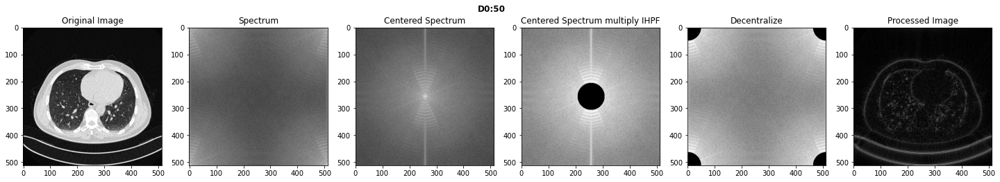

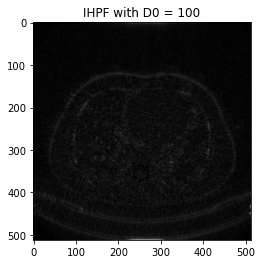

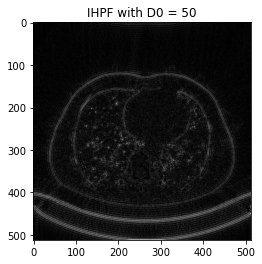

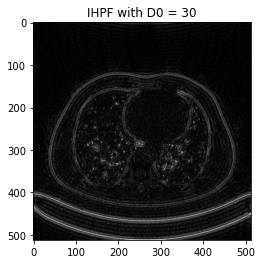

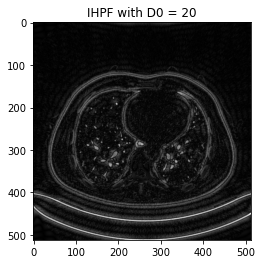

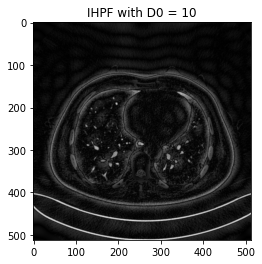

In [36]:
high_pass(50, 0, 'IHPF', 0, img_base)
for i in [100,50,30,20,10]:
    high_pass(i, 1, 'IHPF', 0, img_base)

As the radius of the IHPF increases the edge sharpens, but the image disappears to black if increased much. radius of 50 to 35 looks better with great edge sharpening. 

There are ring effects present in every image

#### Butterworth High Pass Filter

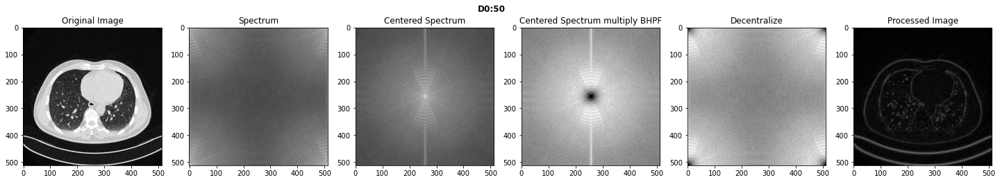

D0 =  100


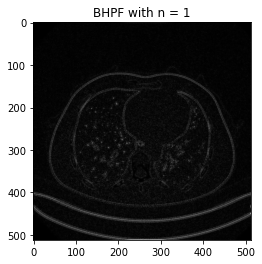

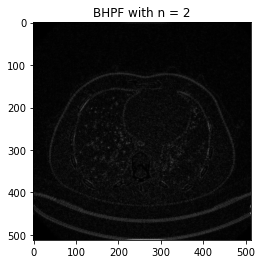

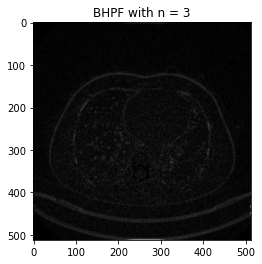

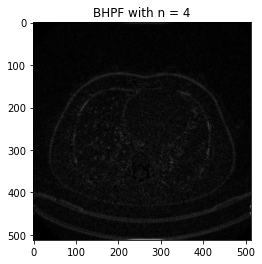

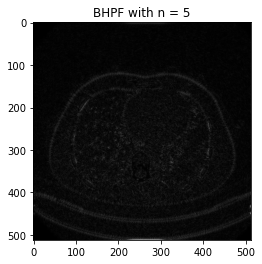

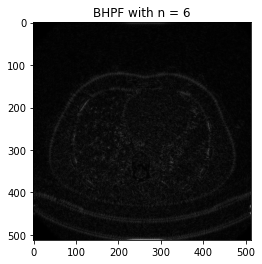

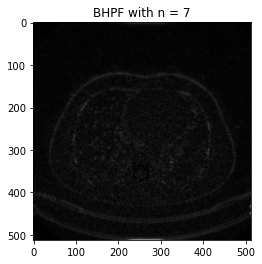

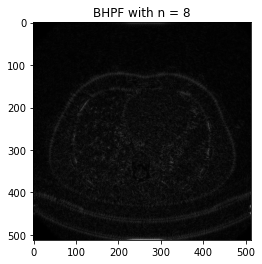

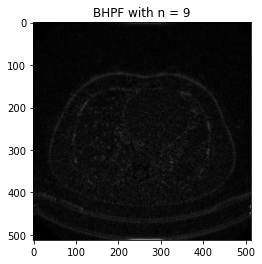

D0 =  50


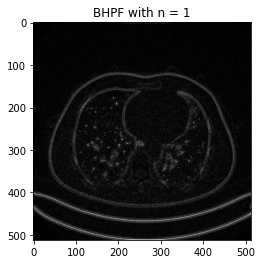

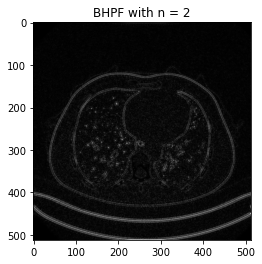

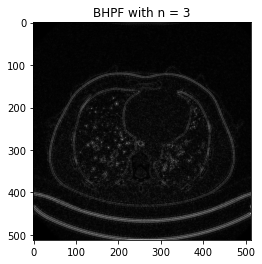

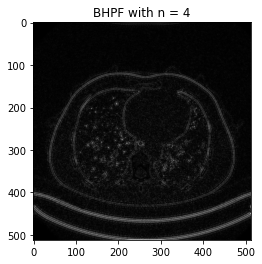

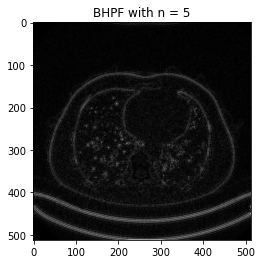

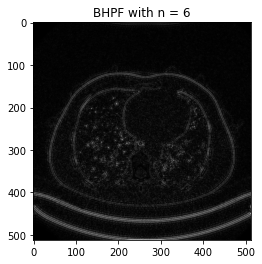

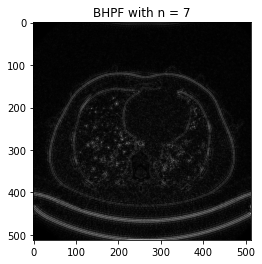

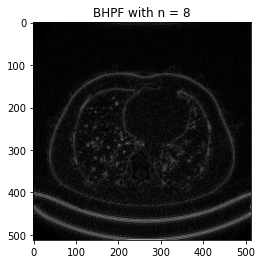

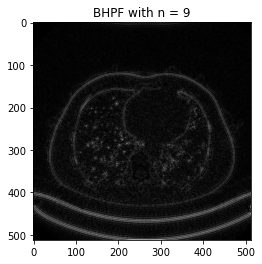

D0 =  30


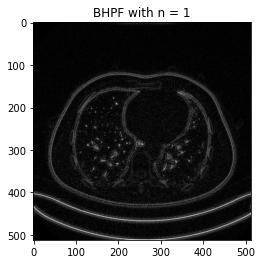

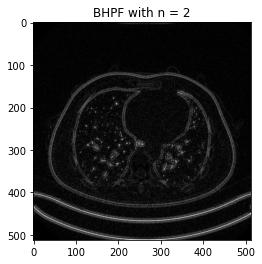

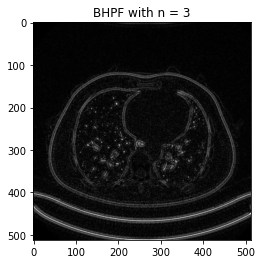

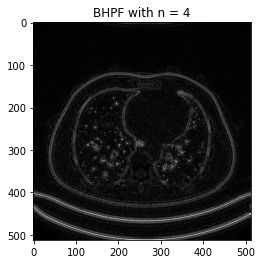

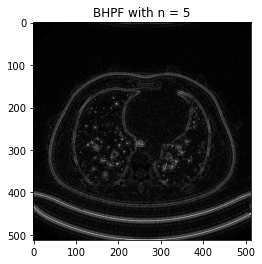

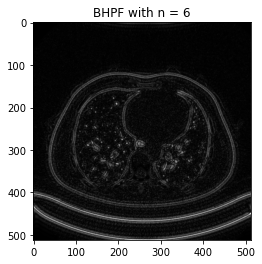

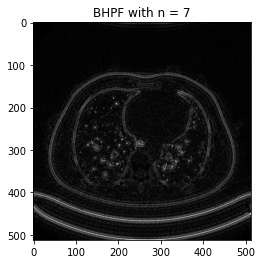

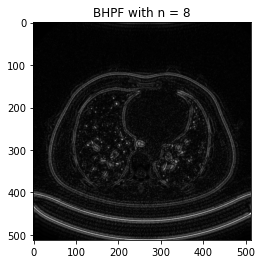

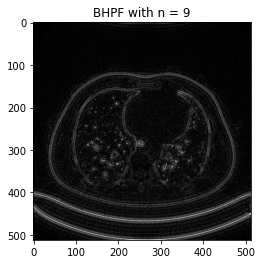

D0 =  20


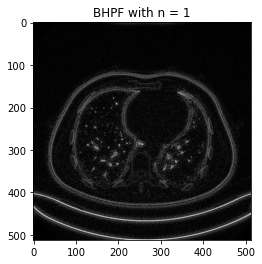

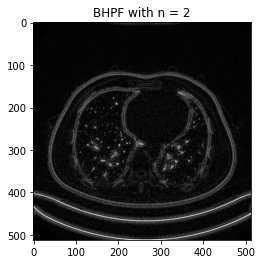

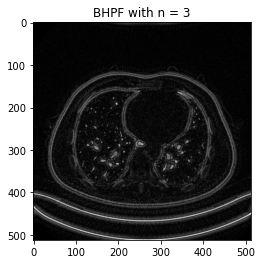

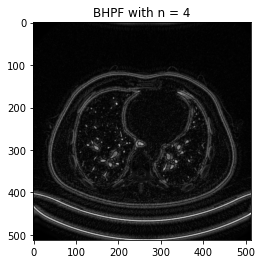

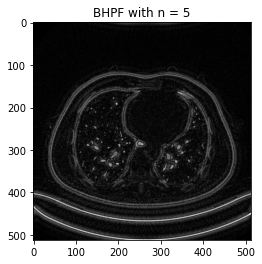

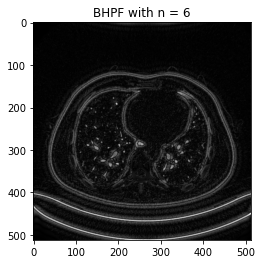

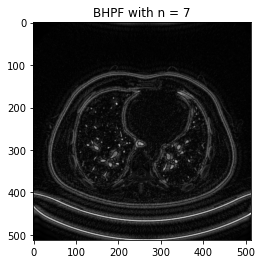

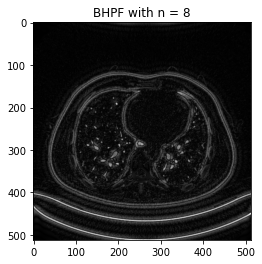

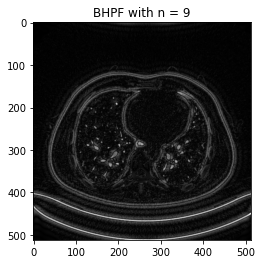

D0 =  10


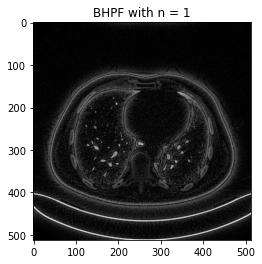

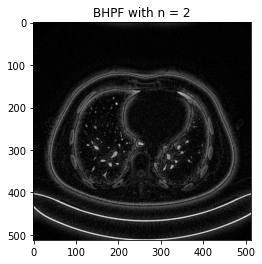

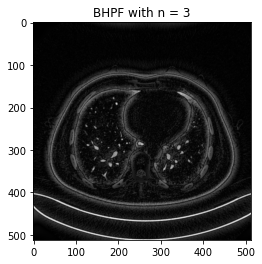

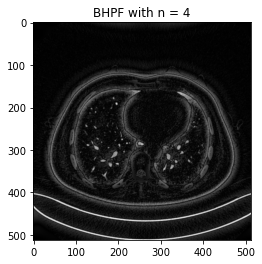

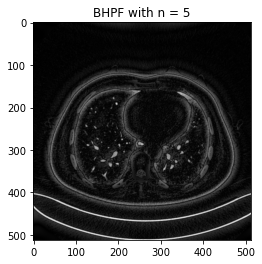

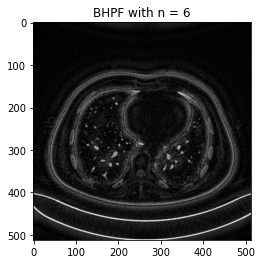

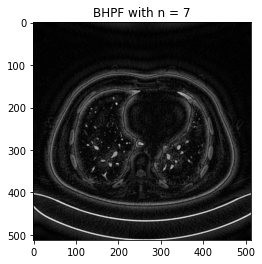

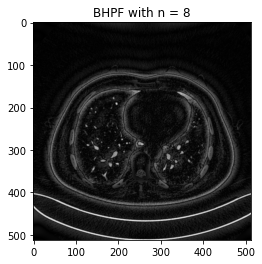

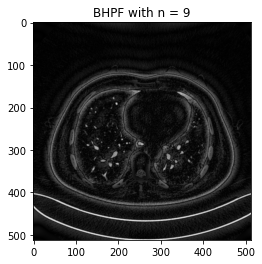

In [37]:
high_pass(50, 0, 'BHPF', 3, img_base)
for i in [100,50,30,20,10]:
    print("D0 = ", i)
    for j in range(1,10):
        high_pass(i, 1, 'BHPF', j, img_base)

BHPF is smoother than IHPF, the boundaries are much less distorted, even for the smallest value of cutoff frequency, as the n increases the ring effect is removed.

The lowest n(1) gives the better result

#### Gaussian High Pass Filter

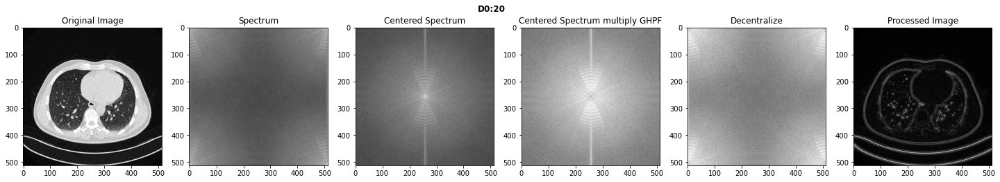

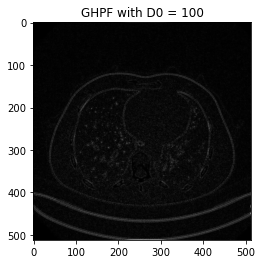

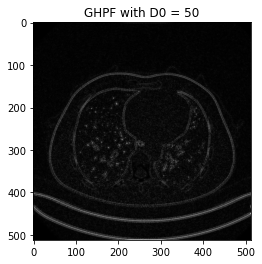

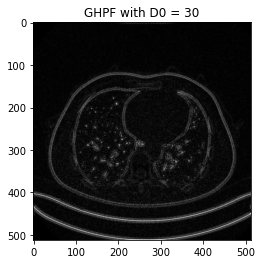

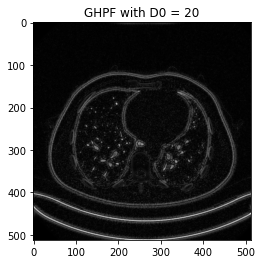

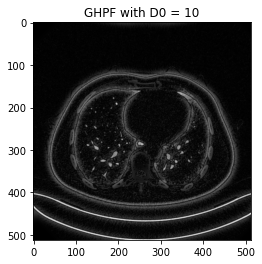

In [38]:
high_pass(20, 0, 'GHPF', 0, img_base)
for i in [100,50,30,20,10]:
    high_pass(i, 1, 'GHPF', 0, img_base)

The split edges are elongated and wider in BHPF case than GHPF. But in GHPF case the split edges are sharper. These elongated split edges in BHPF leads to sharper image than GHPF.

The rings are not present except D0=10

The  resultant images by BHPF is much sharper than GHPF

GHPF is smoother than IHPF

#### Analysis was done using 4 Images - Cancer_3, Cancer_12, Cancer_16, Cancer_17

All these high pass filters are used to sharpen the image but we need to select the desired radius, in order to achieve our result, for our case mostly radius(D0) of 30 - 50 suits our project.

## Inference of Trying out Various Low and High Pass Filters

### Additional Filters Implemented:  
1. Gabor Filter
2. Bilateral Filter

### 1. Gabor Filter

Gabor Filter - Is a convolution filter and is a combination of Gaussian and a Sin term.
Gaussian Component provides the weights while the sin component gives the direction.
It is used to generate Edges and Represent Texture.

For image processing and computer vision, Gabor filters are generally used in texture analysis, edge detection, feature extraction, etc. 
Gabor filters are special classes of bandpass filters, i.e., they allow a certain ‘band’ of frequencies and reject the others.

Used to generate features which can then be pushed into a ML Model
Usually, 10s or 100s of different Varieties of Gabor filters need to be used and those outputs are plugged into a ML Model.

Parameters:

ksize  - Size of the filter returned  
sigma  - Standard deviation of the gaussian envelope  
theta  - Orientation of the normal to the parallel stripes of a Gabor function.  
lambda - Wavelength of the sinusoidal factor.  
gamma  - Spatial aspect ratio.  
psi    - Phase offset  

In [39]:
ksize = 15           #Use size that makes sense to the image and fetaure size. Large may not be good. 
sigma = 0.1          #Large sigma on small features will fully miss the features. 
theta = 1*np.pi/4    #/4 shows horizontal 3/4 shows other horizontal.
lamda = 1*np.pi/4    #1/4 works best for angled. 
gamma = 0.1          #Value of 1 defines spherical. Value close to 0 has high aspect ratio
                     #Value of 1, spherical may not be ideal as it picks up features from other regions.
phi = 0              #Phase offset.

In [40]:
#Set 1
ksize_1 = 15           
sigma_1 = 0.1          
theta_1 = 1*np.pi/4
lamda_1 = 1*np.pi/4
gamma_1 = 0.1                
phi_1 = 0  

#Set 2
ksize_2 = 30           
sigma_2= 2          
theta_2= 1*np.pi/2
lamda_2= 1*np.pi/4
gamma_2= 0.5                
phi_2= 0  

#Set 3
ksize_3 = 25           
sigma_3= 0.1          
theta_3= 1*np.pi/4
lamda_3= 1*np.pi/4
gamma_3= 1                
phi_3= 0  

#Set 4
ksize_4 = 30           
sigma_4 = 2          
theta_4 = 1*np.pi/4
lamda_4 = 1*np.pi/2
gamma_4 = 0.1                
phi_4 = 0  

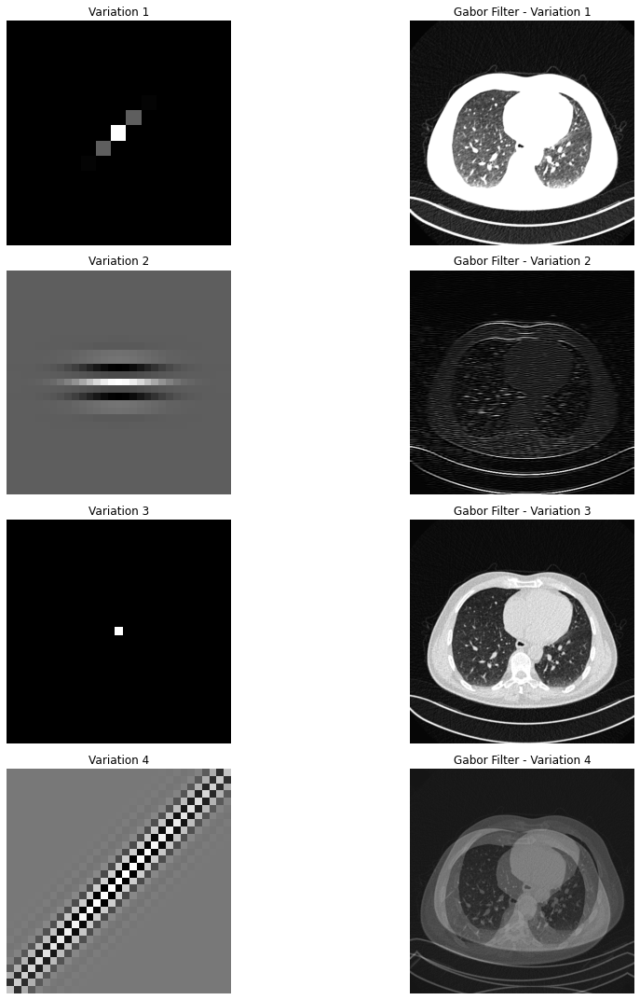

In [41]:
kernel_1 = cv2.getGaborKernel((ksize_1, ksize_1), sigma_1, theta_1, lamda_1, gamma_1, phi_1, ktype=cv2.CV_32F)
gabor_1 = cv2.filter2D(img_base, cv2.CV_8UC3, kernel_1)

kernel_2 = cv2.getGaborKernel((ksize_2, ksize_2), sigma_2, theta_2, lamda_2, gamma_2, phi_2, ktype=cv2.CV_32F)
gabor_2 = cv2.filter2D(img_base, cv2.CV_8UC3, kernel_2)

kernel_3 = cv2.getGaborKernel((ksize_3, ksize_3), sigma_3, theta_3, lamda_3, gamma_3, phi_3, ktype=cv2.CV_32F)
gabor_3 = cv2.filter2D(img_base, cv2.CV_8UC3, kernel_3)

kernel_4 = cv2.getGaborKernel((ksize_4, ksize_4), sigma_4, theta_4, lamda_4, gamma_4, phi_4, ktype=cv2.CV_32F)
gabor_4 = cv2.filter2D(img_base, cv2.CV_8UC3, kernel_4)

fig = plt.figure(figsize=(15, 15),constrained_layout = True)

fig.add_subplot(4,2,1)
plt.imshow(kernel_1,cmap='gray')
plt.axis("off")
plt.title("Variation 1")

fig.add_subplot(4,2,2)
plt.imshow(gabor_1,cmap='gray')
plt.axis("off")
plt.title("Gabor Filter - Variation 1")

fig.add_subplot(4,2,3)
plt.imshow(kernel_2,cmap='gray')
plt.axis("off")
plt.title("Variation 2")

fig.add_subplot(4,2,4)
plt.imshow(gabor_2,cmap='gray')
plt.axis("off")
plt.title("Gabor Filter - Variation 2")

fig.add_subplot(4,2,5)
plt.imshow(kernel_3,cmap='gray')
plt.axis("off")
plt.title("Variation 3")

fig.add_subplot(4,2,6)
plt.imshow(gabor_3,cmap='gray')
plt.axis("off")
plt.title("Gabor Filter - Variation 3")

fig.add_subplot(4,2,7)
plt.imshow(kernel_4,cmap='gray')
plt.axis("off")
plt.title("Variation 4")

fig.add_subplot(4,2,8)
plt.imshow(gabor_4,cmap='gray')
plt.axis("off")
plt.title("Gabor Filter - Variation 4")

fig.tight_layout()
plt.show()

### 2. Bilateral Filter

Edge Preserving Denosing Filter - Much better than Gaussian Denoising because it preserves the Edges  
Replaces Each Pixel Value with a Weighted Average of nearby Pixel Values   
Takes into account the variation of intensities to preserve edges  
2 Parameters - Sigma s and Sigma r  
Sigma s - Spatial - Controls the influence of distant pixels  (Spatial Weight)  
Sigma r - Controls the influence of Range of Pixels with intensity values different from the center pixel(Range Weight)  
if Sigma s is very large, it mimicks a Gaussian Filter

Text(0.5, 1.0, 'Variation 3')

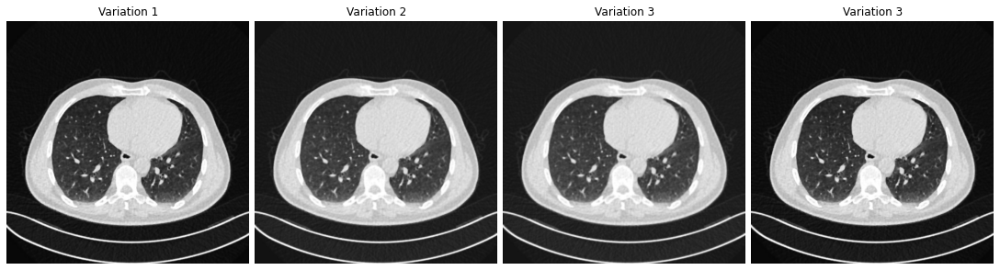

In [42]:
#cv2.bilateralFilter(img, kernalsize, sigmaS(sigmaColor (0 - 100)), sigmaR(sigmaSpace), handling border pixels)
#A larger sigmaS value adds blur to the output and gets it closer to Gaussian Smoothening
#A larger sigmaC value makes the larger features smoother 
bilateral_filter_1 = cv2.bilateralFilter(img_base, 5, 20, 100, borderType=cv2.BORDER_CONSTANT)
bilateral_filter_2 = cv2.bilateralFilter(img_base, 5, 40, 100, borderType=cv2.BORDER_CONSTANT)
bilateral_filter_3 = cv2.bilateralFilter(img_base, 5, 60, 100, borderType=cv2.BORDER_CONSTANT)
bilateral_filter_4 = cv2.bilateralFilter(img_base, 5, 20, 50, borderType=cv2.BORDER_CONSTANT)

fig = plt.figure(figsize=(15, 15),constrained_layout = True)

fig.add_subplot(2,4,1)
plt.imshow(bilateral_filter_1,cmap='gray')
plt.axis("off")
plt.title("Variation 1")

fig.add_subplot(2,4,2)
plt.imshow(bilateral_filter_2,cmap='gray')
plt.axis("off")
plt.title("Variation 2")

fig.add_subplot(2,4,3)
plt.imshow(bilateral_filter_3,cmap='gray')
plt.axis("off")
plt.title("Variation 3")

fig.add_subplot(2,4,4)
plt.imshow(bilateral_filter_4,cmap='gray')
plt.axis("off")
plt.title("Variation 3")

### Analyzing and finding the Optimal value for Bilateral Filter Constraints

In [43]:
psnr_val = []
rmse_val = []

max_indices_psnr = []
min_indices_rmse = []

max_value_psnr = []
min_value_rmse = []

sigmaS = [20,40,60,80,100]
for s in sigmaS:
    psnr_val = []
    rmse_val = []
    for sigmaR in range(20, 100, 15):
        img_base = cv2.imread(image_path,0)
        bilateral = cv2.bilateralFilter(img_base, 5, s, sigmaR, borderType=cv2.BORDER_CONSTANT)
        psnr_val.append(psnr(bilateral, img_base))
        rmse_val.append(rmsdiff(img_base, bilateral)) 
    #Finding Max PSNR
    max_valuepsnr = max(psnr_val)
    index_psnr = psnr_val.index(max_valuepsnr)
    max_indices_psnr.append(index_psnr)
    max_value_psnr.append(max_valuepsnr)

    #Finding Min RMSE
    min_valuermse = min(rmse_val)
    index_rmse = rmse_val.index(min_valuermse)
    min_indices_rmse.append(index_rmse)
    min_value_rmse.append(min_valuermse)

In [44]:
max_indices_psnr

[0, 0, 0, 0, 0]

In [45]:
max_value_psnr

[36.65614824979959,
 35.27605053472966,
 34.920308517096,
 34.574243026633994,
 34.350896587612525]

In [46]:
best_value = max(max_value_psnr)
index_bestvalue_sigmaS = max_value_psnr.index(best_value)
index_bestvalue_sigmaR = max_indices_psnr[max_value_psnr.index(best_value)]
#Adding 1 because Radius start from 1 and not 0
print("Sigma S chosen is" ,sigmaS[index_bestvalue_sigmaS],"corresponding to the Max PSNR from the calculated values")
print("Sigma R chosen is: 20")

Sigma S chosen is 20 corresponding to the Max PSNR from the calculated values
Sigma R chosen is: 20


PSNR of Bilateral Filter:  39.0434126597055
RMSE of Bilateral Filter:  2.8468825305625565


Text(0.5, 1.0, 'Filtered Image')

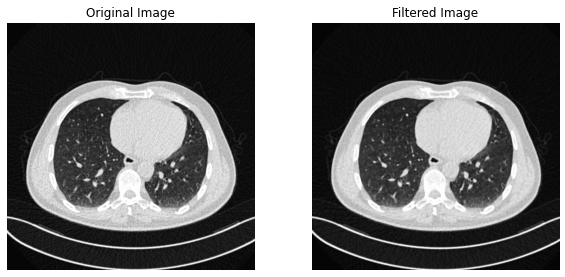

In [47]:
img_filtered_bi = cv2.bilateralFilter(img_base, 5, 20, 0, borderType=cv2.BORDER_CONSTANT)
print("PSNR of Bilateral Filter: ",psnr(img_filtered_bi, img_base))
print("RMSE of Bilateral Filter: ",rmsdiff(img_filtered_bi, img_base))
fig = plt.figure(figsize=(10, 10)) 

fig.add_subplot(2,2,1)
plt.imshow(img_base,cmap='gray')
plt.axis("off")
plt.title("Original Image")

fig.add_subplot(2,2,2)
plt.imshow(img_filtered_bi,cmap='gray')
plt.axis("off")
plt.title("Filtered Image")

### Analyzing and Finding Optimal values for Median Filter

In [48]:
psnr_val = []
rmse_val = []

max_indices_psnr = []
min_indices_rmse = []

max_value_psnr = []
min_value_rmse = []

ksize_arr = [3,5,7,9,11,13,15,17,19,21,23,25,31,35,41]
for ksize in ksize_arr:
    psnr_val = []
    rmse_val = []
    img_median = cv2.medianBlur(img_base,ksize)
    
    psnr_val.append(psnr(img_median, img_base))
    rmse_val.append(rmsdiff(img_base, img_median)) 
    #Finding Max PSNR
    max_valuepsnr = max(psnr_val)
    index_psnr = psnr_val.index(max_valuepsnr)
    max_indices_psnr.append(index_psnr)
    max_value_psnr.append(max_valuepsnr)

    #Finding Min RMSE
    min_valuermse = min(rmse_val)
    index_rmse = rmse_val.index(min_valuermse)
    min_indices_rmse.append(index_rmse)
    min_value_rmse.append(min_valuermse)

In [49]:
max_indices_psnr

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

In [50]:
max_value_psnr

[37.83240966002886,
 34.13933697897463,
 33.12233375611232,
 32.705601116202594,
 32.43265635081447,
 32.285772704247165,
 32.18341693522675,
 32.0809313133948,
 31.99199779538582,
 31.925877568116462,
 31.87413426173398,
 31.81593790668551,
 31.68556367607342,
 31.625966700591896,
 31.537246035311345]

In [51]:
best_value_med = max(max_value_psnr)
index_bestvalue_med = max_value_psnr.index(best_value_med)

In [52]:
print("Kernal Size chosen is" ,ksize_arr[index_bestvalue_med],"corresponding to the Max PSNR from the calculated values")

Kernal Size chosen is 3 corresponding to the Max PSNR from the calculated values


PSNR of Median Filter:  37.83240966002886
RMSE of Median Filter:  3.2728017403578624


Text(0.5, 1.0, 'Filtered Image')

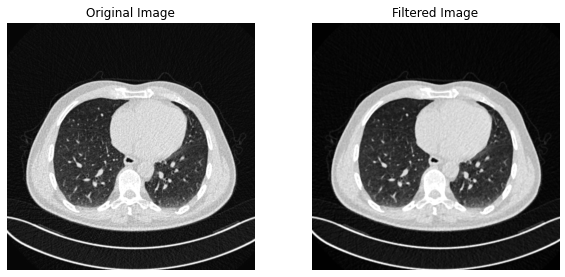

In [53]:
img_filtered = cv2.medianBlur(img_base,3)
print("PSNR of Median Filter: ",psnr(img_filtered, img_base))
print("RMSE of Median Filter: ",rmsdiff(img_filtered, img_base))
fig = plt.figure(figsize=(10, 10)) 

fig.add_subplot(2,2,1)
plt.imshow(img_base,cmap='gray')
plt.axis("off")
plt.title("Original Image")

fig.add_subplot(2,2,2)
plt.imshow(img_filtered,cmap='gray')
plt.axis("off")
plt.title("Filtered Image")

#### Hence for our application of Pre-processing CT Scan Images of Lungs, we have found that Salt and Pepper, Gaussian and Speckle Noise are the most frequent occuring Noises
Hence, we pass the image through a Bilateral Filter and a Median Filter before trying Edge Detection Filters to better improve their accuracy.  
Reason: First and Second Derivative filters don't perform that well when noise is present in the images.

In [54]:
img_processed = cv2.medianBlur(img_base,3)
img_processed = cv2.bilateralFilter(img_processed, 5, 20, 0, borderType=cv2.BORDER_CONSTANT)

In [55]:
#Having a Frequency Domain processed Image
img_processed_freq = apply_high_pass(img_processed, 50, 'GHPF', 0)

### Laplacian vs Sobel Operator in Frequency and Spatial Domain

Text(0.5, 1.0, 'Spatial Domain Thresholding')

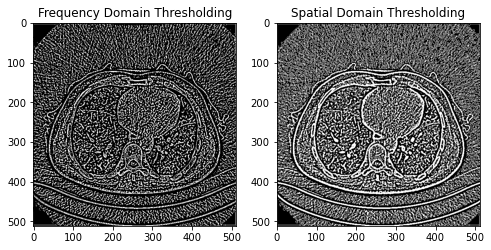

In [56]:
laplacian_freq = cv2.Laplacian(img_processed_freq,ddepth=cv2.CV_64F)
laplacian_spatial = cv2.Laplacian(cv2.GaussianBlur(img_processed,(5,5),1),ddepth=cv2.CV_64F)

ret2, th_freq = cv2.threshold(laplacian_freq.astype('uint16'), 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
ret2, th_spatial = cv2.threshold(laplacian_spatial.astype('uint16'), 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)

plt.figure(figsize=(8, 8))
plt.subplot(1,2,1)
plt.imshow(th_freq,cmap='gray')
plt.title("Frequency Domain Thresholding")
plt.subplot(1, 2, 2)
plt.imshow(th_spatial, cmap='gray')
plt.title("Spatial Domain Thresholding")

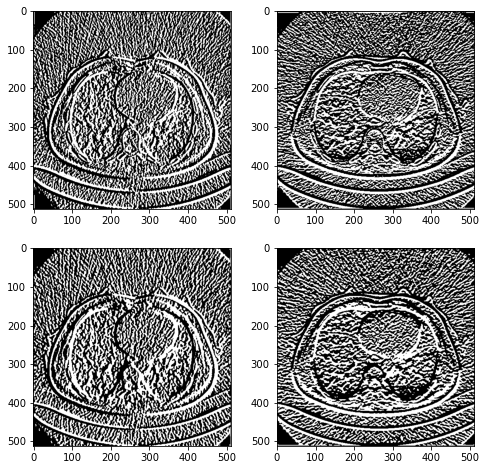

In [57]:
sobelx_freq = cv2.Sobel(img_processed_freq, cv2.CV_64F, 1, 0, ksize=3)
sobely_freq = cv2.Sobel(img_processed_freq,cv2.CV_64F,0,1,ksize=3)

sobelx_spatial = cv2.Sobel(cv2.GaussianBlur(img_processed, (5, 5), 0),cv2.CV_64F, 1, 0, ksize=3)
sobely_spatial = cv2.Sobel(cv2.GaussianBlur(img_processed, (5, 5), 0),cv2.CV_64F, 0, 1, ksize=3)

ret2, th_xfreq = cv2.threshold(sobelx_freq.astype('uint16'), 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
ret2, th_yfreq = cv2.threshold(sobely_freq.astype('uint16'), 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)

ret2, th_xspatial = cv2.threshold(sobelx_spatial.astype('uint16'), 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
ret2, th_yspatial = cv2.threshold(sobely_spatial.astype('uint16'), 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)

plt.figure(figsize=(8, 8))
plt.subplot(2, 2, 1)
plt.imshow(th_xfreq, cmap='gray')
plt.subplot(2, 2, 2)
plt.imshow(th_yfreq, cmap='gray')

plt.subplot(2, 2, 3)
plt.imshow(th_xspatial, cmap='gray')
plt.subplot(2, 2, 4)
plt.imshow(th_yspatial, cmap='gray')

In conclusion, we are not able find much of a difference when using Laplacian and Sobel Derivative filters and hence, we plan on using Canny Edge Detector to capture the edges properly

Since our application is in the field of Medical Imaging, noise is a major issue which degrades the quality of images.
Degradation includes Blurring of Boundaries, Suppression of Edges etc.
Since this is a critical field where accuracy of decisions have high importance, we have identified some common Noises found during CT Images and its corrective Filter which preserves the edges and other details in the image. The following are some frequently found noises:
1. Salt and Pepper Noise - Median Filter gives the best result - Spatial Filtering
2. Gaussian Noise - Median or Averaging Filter - Spatial Filtering
3. Speckle/ Multiplicative Noise -   
    * Following filters can be used:
        * Homomorphic Filter
        * Median Filter
        * Bilateral Filter
        * Weiner Filter
We came to this conclusion by using 2 Metrics for Evaluating the effectiveness of filters:
1. PSNR - Peak Signal Noise Ration
2. RMSE - Root Mean Square Error between the Intensities of 2 Images
The following is the Inference:
Higher the PSNR, the lesser noise is found which tends to give a better output
Lower the RSME, the more similar 2 Images are.
Hence, A good filter would have High PSNR Value at the same time have a Low RMSE Value

### Following is the Observation Table



| Noise     | Filter Used |  Type   | PSNR | RMSE |
| :---:        |    :----:   |          :---: | :---: | :---: |
| Gaussian Noise   | Median and Gaussian Filter         | Spatial Domain  | 31.96 | 6.43 |
| Salt and Pepper      | Median Filter       | Spatial Domain   | 37.9 | 3.24 |
| Speckle Noise   | Bilateral Filter       | Spatial Domain     | 33.82 | 5.19 |